In [1]:
import numpy as np
import pandas as pd
import pylab
import matplotlib
import matplotlib.pyplot  as plt
import matplotlib.gridspec as gridspec
import os 
%matplotlib inline


In [2]:
#doping data, eduardos experiments 

no_CH2F2_temps_inv, no_CH2F2_taus, no_CH2F2_label, no_CH2F2_color, no_CH2F2_shape  = [[0.63269666, 0.56358202, 0.61326454, 0.62338108, 0.6588242,  0.74256908,
 0.77973157, 0.74591045, 0.65343648, 0.6813308], 
 [0.140397, 0.03592654, 0.08382547, 0.1015549,  0.21059732, 1.74050565,
 3.16531584, 1.67252058, 0.19990897, 0.36081361], '0% CH$_2$F$_2$', 'k', 's']
                                                                      
                    
pt1_CH2F2_temps_inv, pt1_CH2F2_taus, pt1_CH2F2_label, pt1_CH2F2_color,  pt1_CH2F2_shape =[[0.71625797, 0.56876523, 0.58520137, 0.6216291, 0.70274495, 0.68888998,
 0.74213088], 
 [1.21382961, 0.0471075,  0.07372893, 0.12092486, 0.67064511, 0.55730096,
 2.02355779], '0.1% CH$_2$F$_2$', 'm', 's']
                                                          
    
pt5_CH2F2_temps_inv, pt5_CH2F2_taus, pt5_CH2F2_label, pt5_CH2F2_color,  pt5_CH2F2_shape  = [[0.64051452, 0.74256407, 0.75806182, 0.59921964, 0.55737473, 0.69714701,
 0.71456021, 0.68253075], 
 [0.19242997, 2.08706923, 2.24174715, 0.08639935, 0.04194953, 0.63637152,
 1.06022888, 0.4540505 ], '0.5% CH$_2$F$_2$', 'c', 'v'] 

_2_CH2F2_temps_inv, _2_CH2F2_taus, _2_CH2F2_label, _2_CH2F2_color,  _2_CH2F2_shape = [[0.6014515, 0.72489571, 0.76260487, 0.63965302, 0.64586785, 0.66499352,
 0.66447004, 0.69194404, 0.55187601], 
 [0.12278134, 2.15618223, 3.8948634,  0.28953096, 0.36193926, 0.57132118,
 0.62294087, 1.16312355, 0.051226],  '2% CH$_2$F$_2$', 'b', '^']

_4_CH2F2_temps_inv, _4_CH2F2_taus, _4_CH2F2_label, _4_CH2F2_color,  _4_CH2F2_shape = [[0.59342286, 0.56586408, 0.61717534, 0.66810691, 0.69578168, 0.71392225,
 0.52988636], 
 [0.2396125, 0.13106904, 0.40859232, 1.46789449, 2.3113845,  2.8922329,
 0.06264836], '4% CH$_2$F$_2$', 'g', 'o']

#this gets specific temperatures
temps_for_0 = sorted([1000/T_inv for T_inv in no_CH2F2_temps_inv])
temps_for_0_1 = sorted([1000/T_inv for T_inv in pt1_CH2F2_temps_inv])
temps_for_0_5 = sorted([1000/T_inv for T_inv in pt5_CH2F2_temps_inv])
temps_for_2 = sorted([1000/T_inv for T_inv in _2_CH2F2_temps_inv])
temps_for_4 = sorted([1000/T_inv for T_inv in _4_CH2F2_temps_inv])

In [3]:
specific_temps = {0: temps_for_0,
0.1: temps_for_0_1,
0.5: temps_for_0_5,
2: temps_for_2,
4: temps_for_4}

/work/westgroup/nora/miniconda/envs/rmg_env/lib/python3.7/site-packages/ipykernel_launcher.py:56: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.


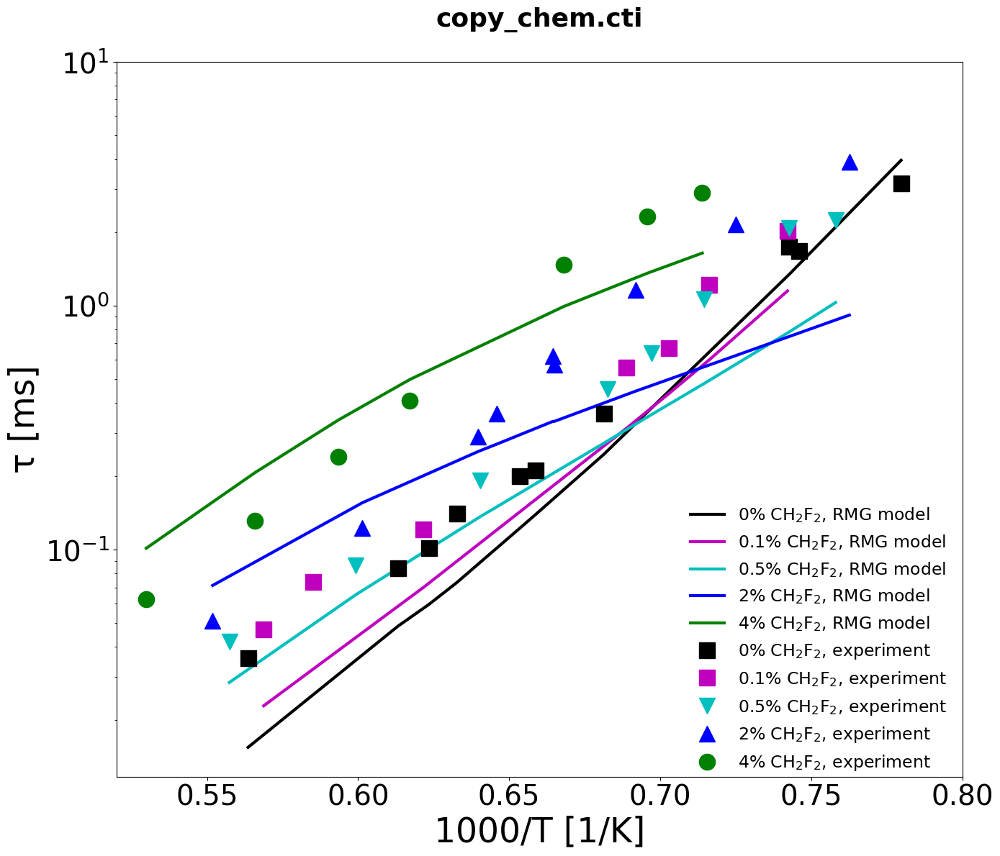

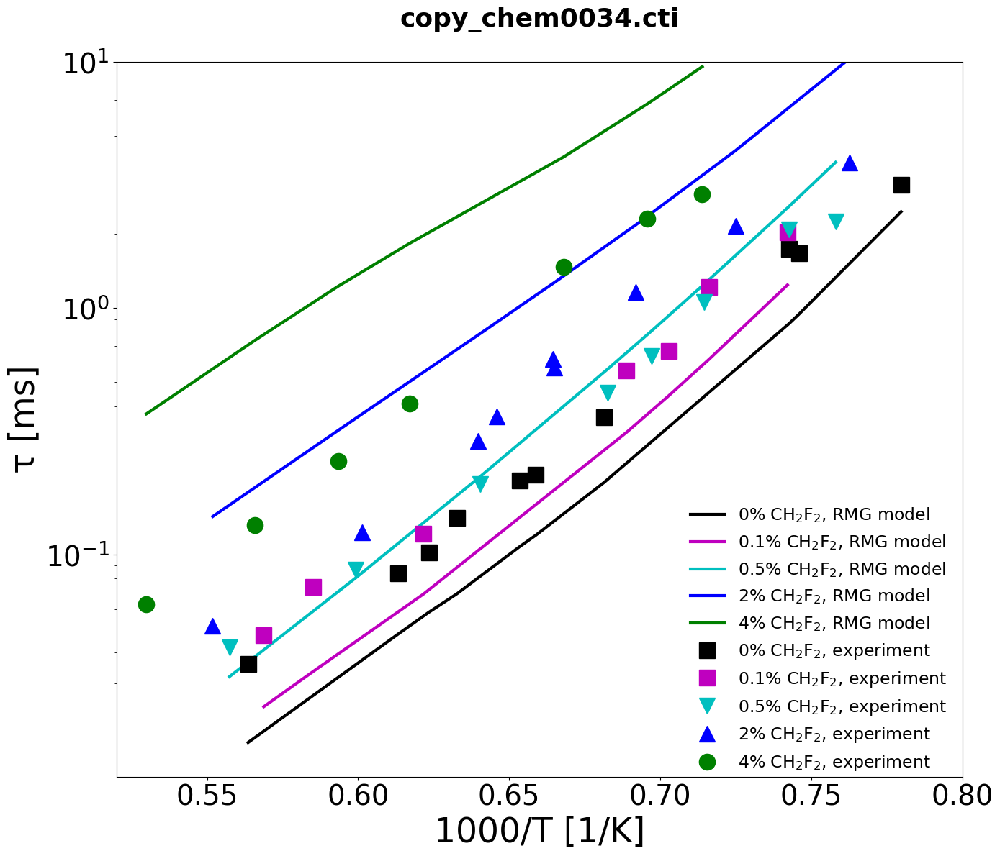

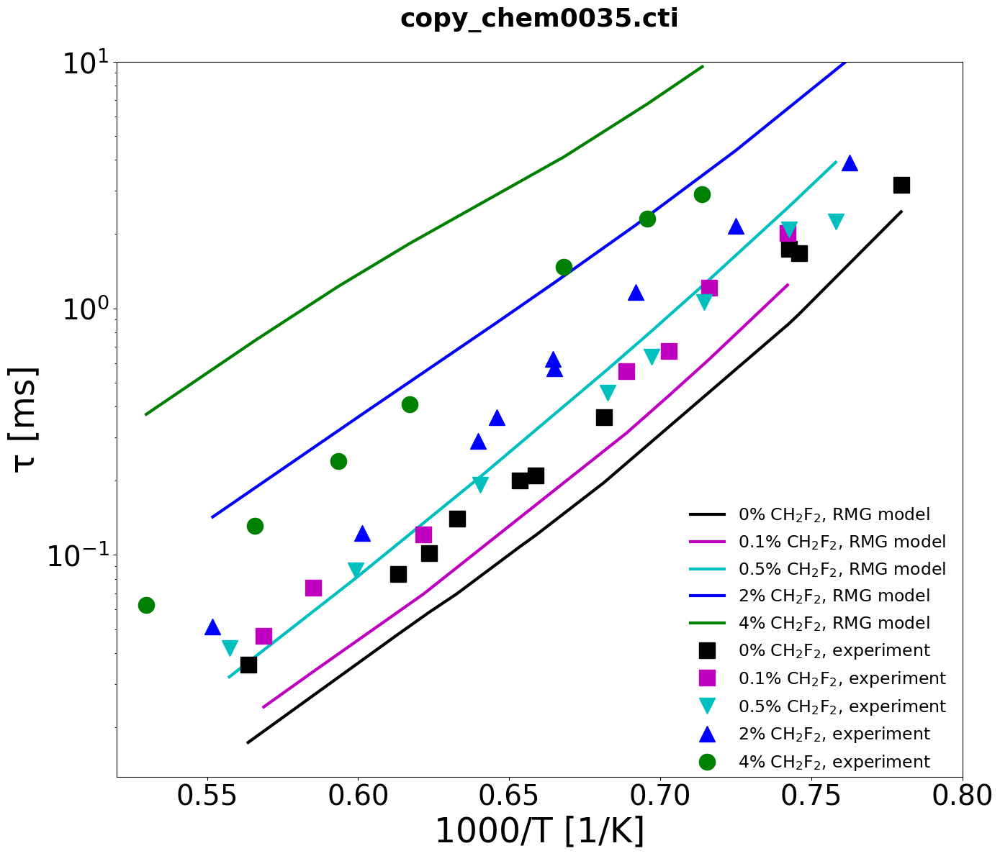

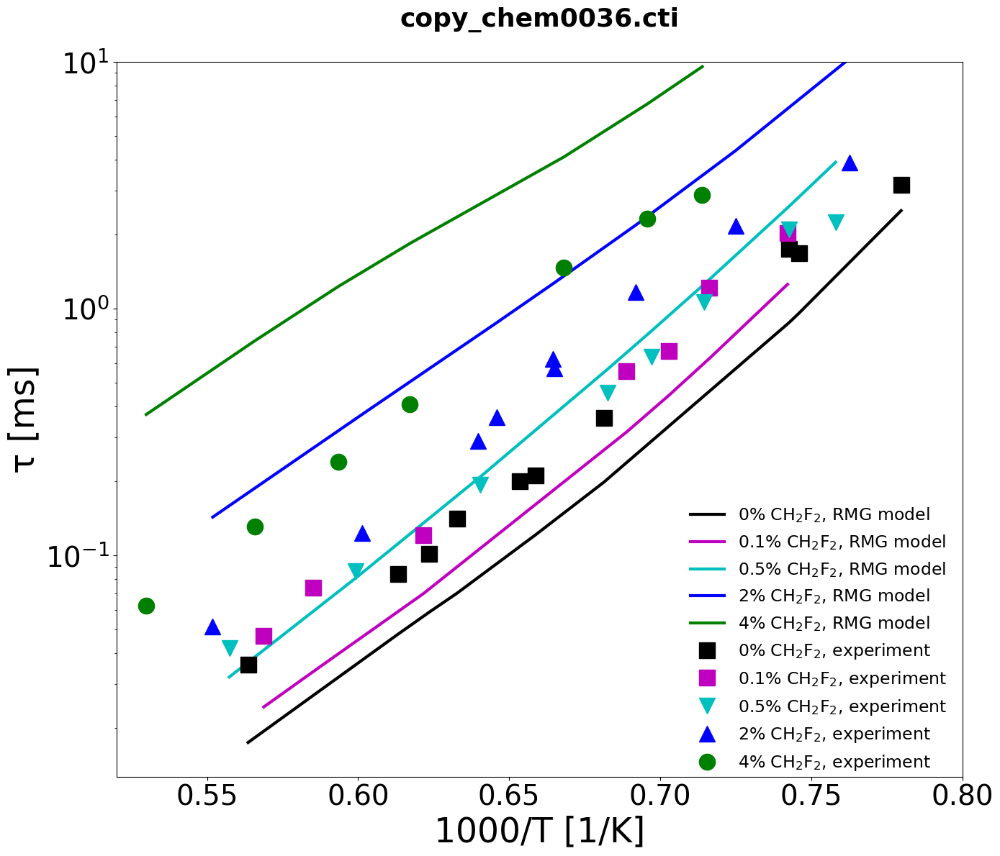

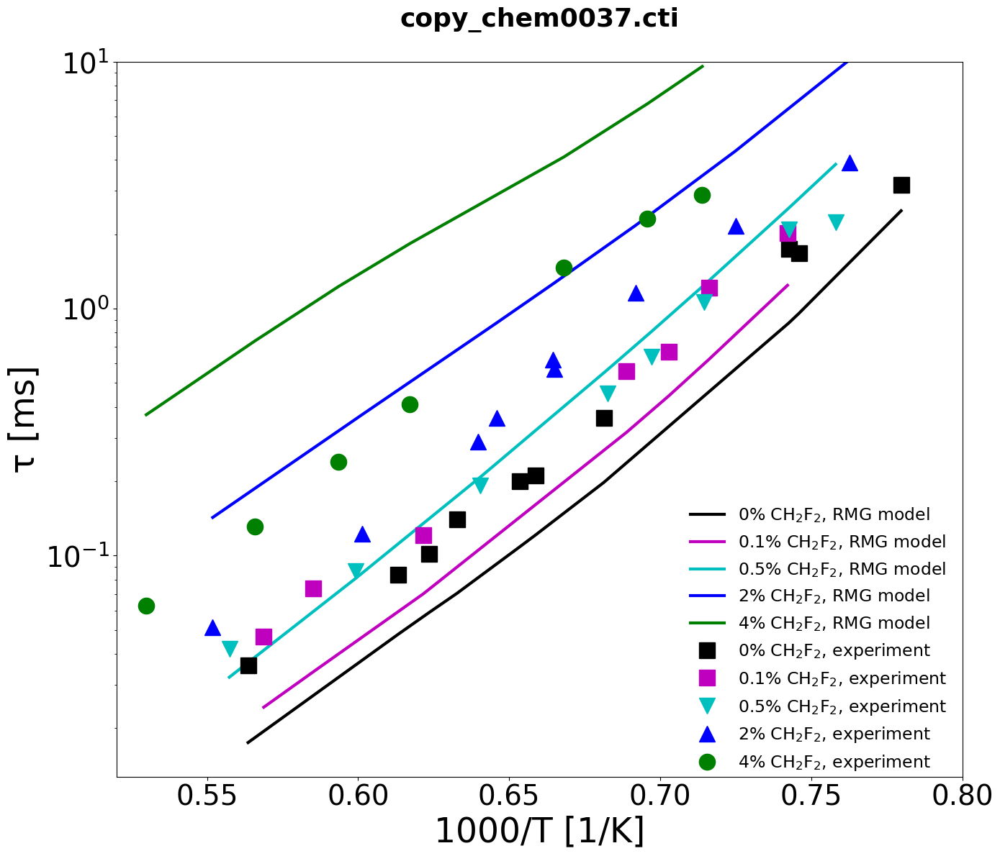

...

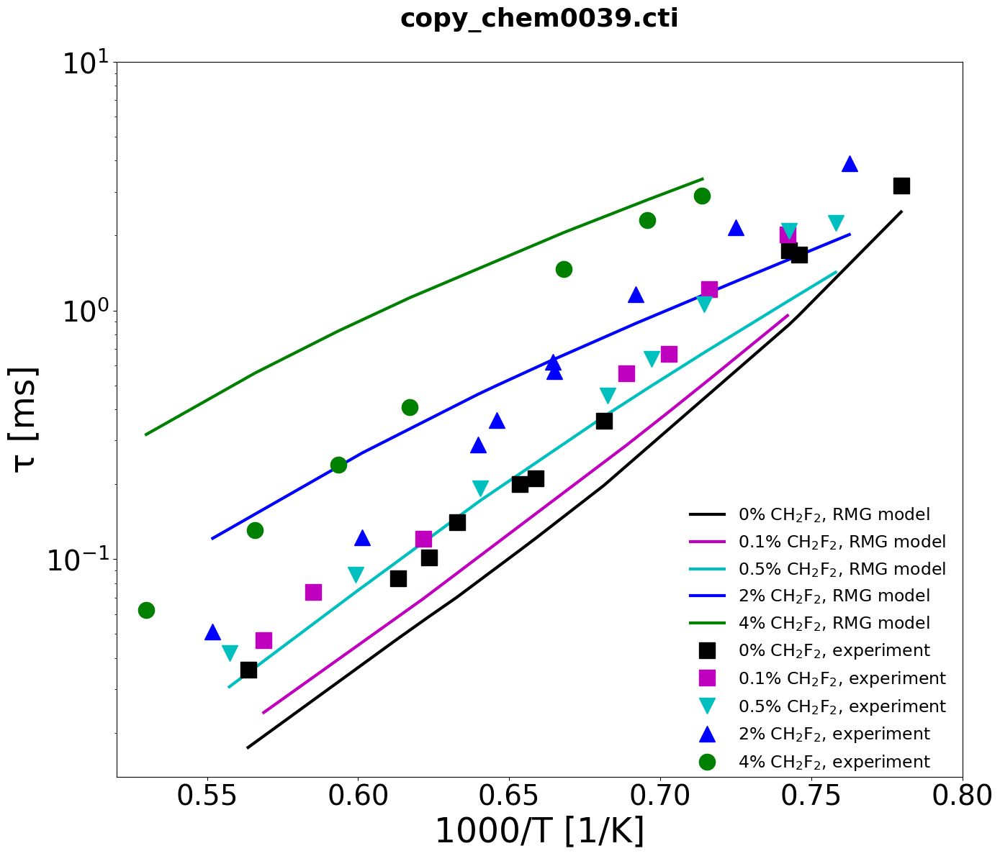

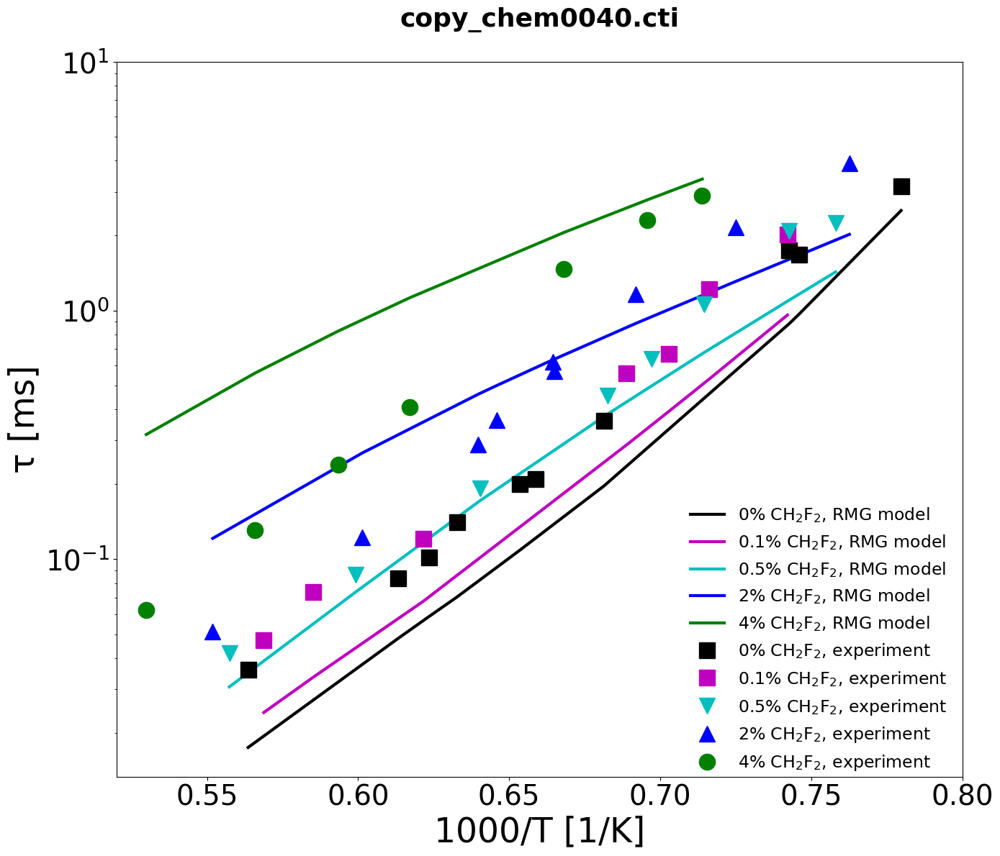

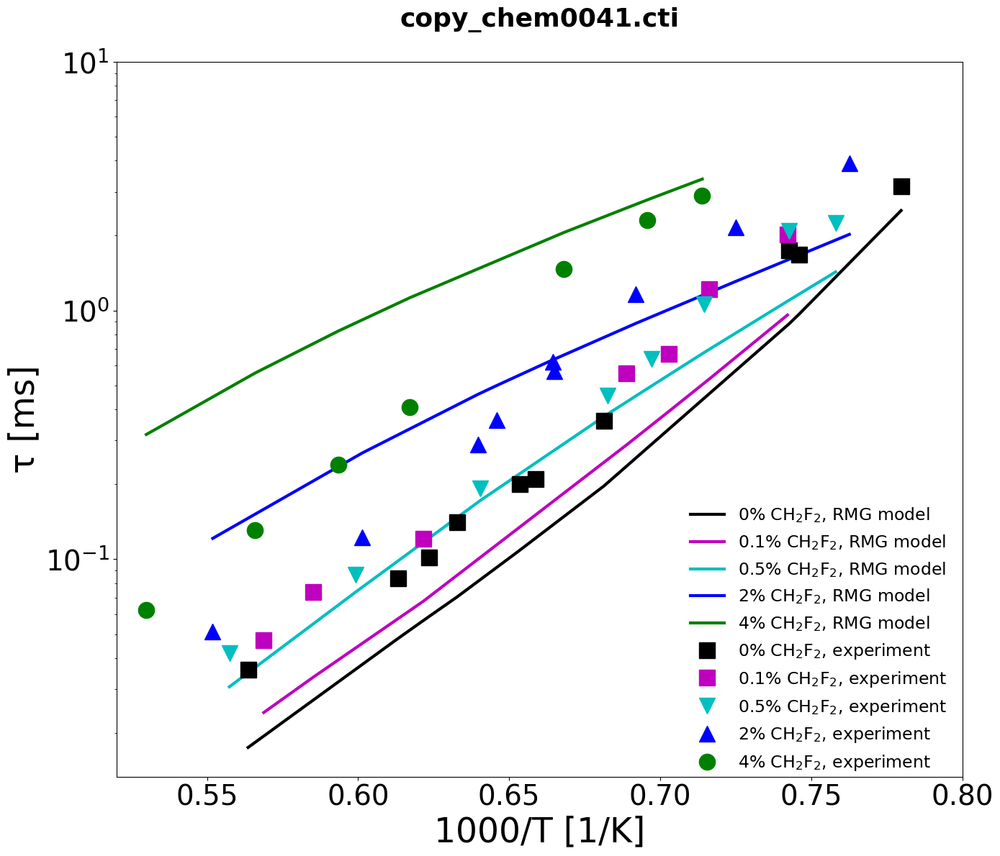

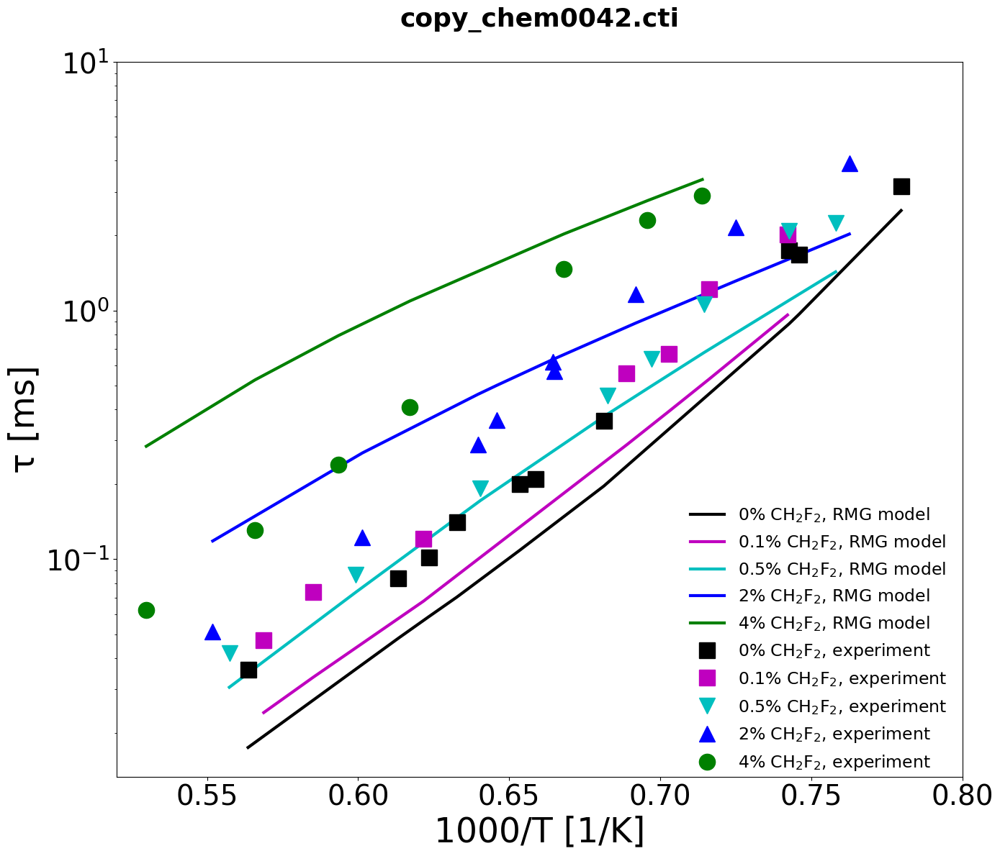

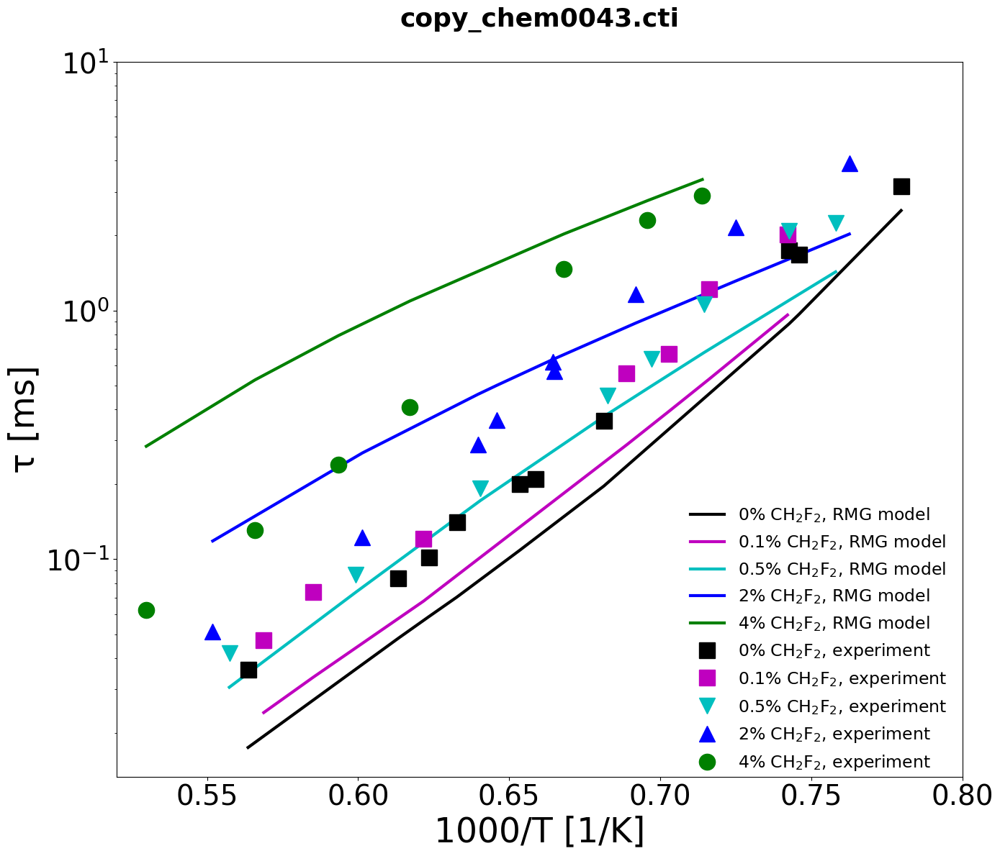

name 'nan' is not defined


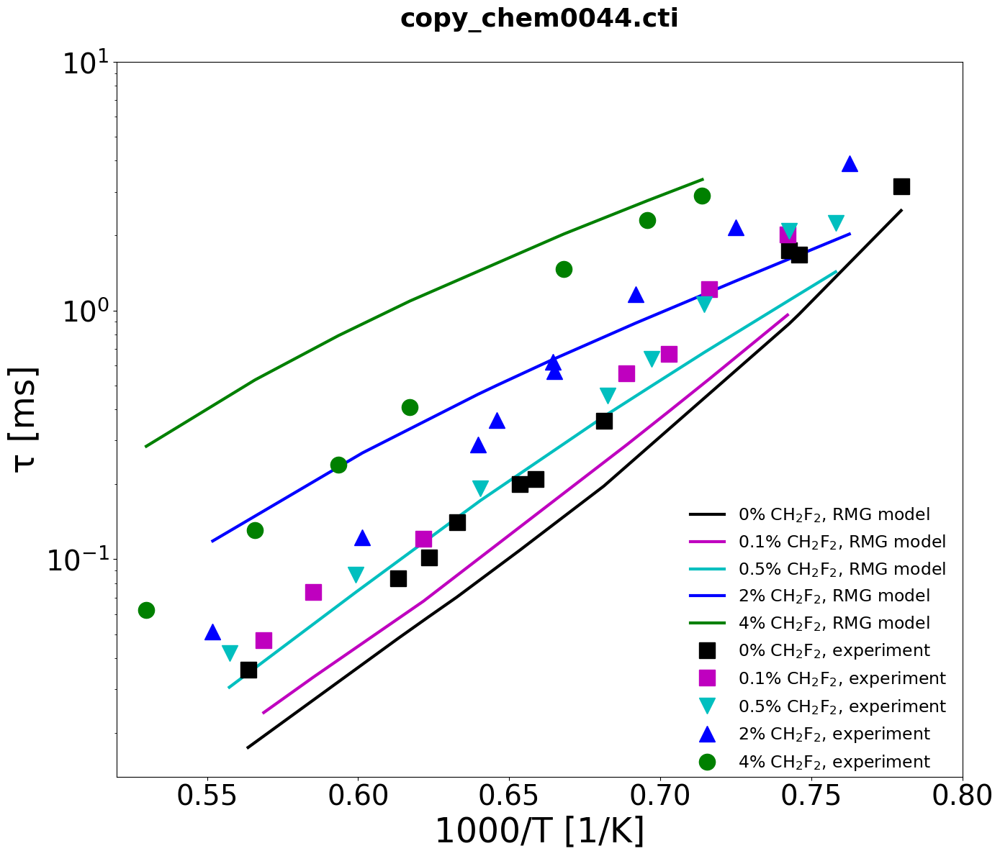

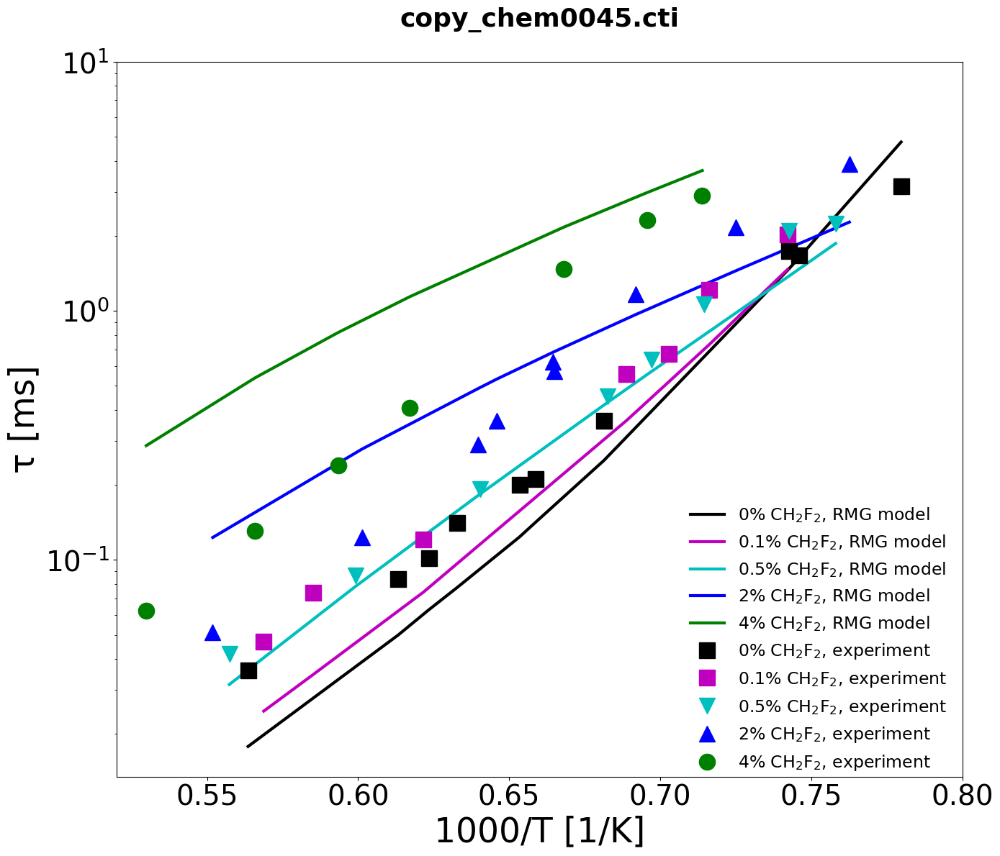

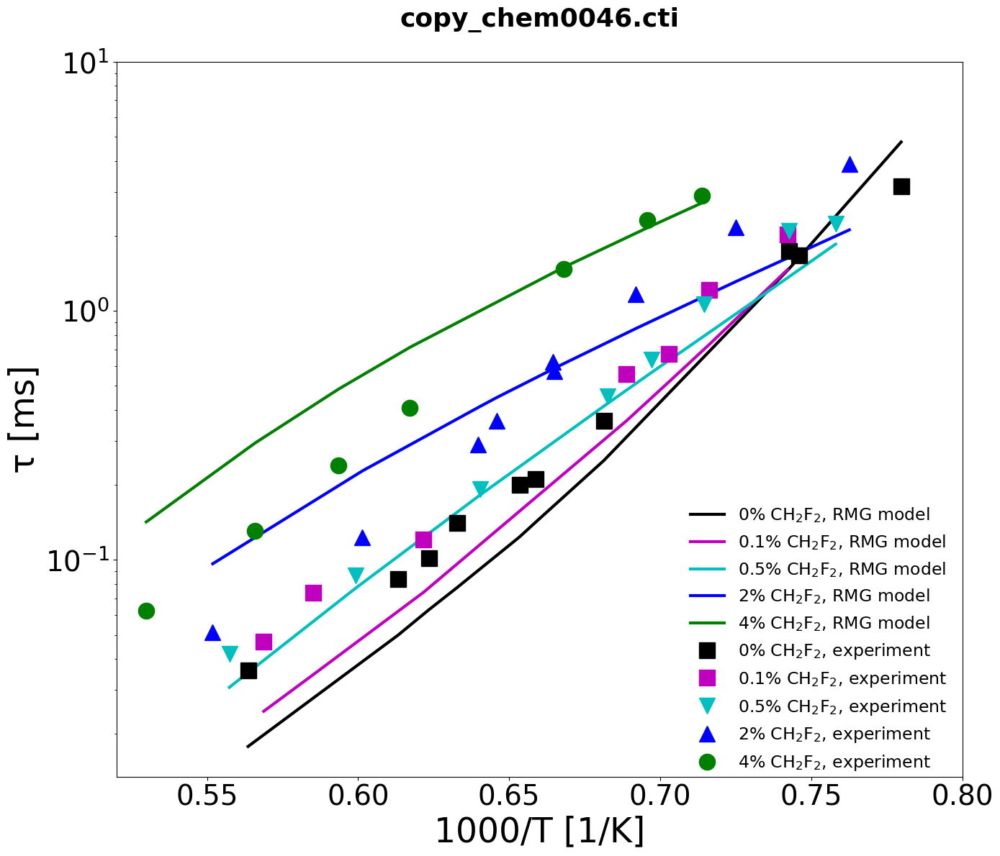

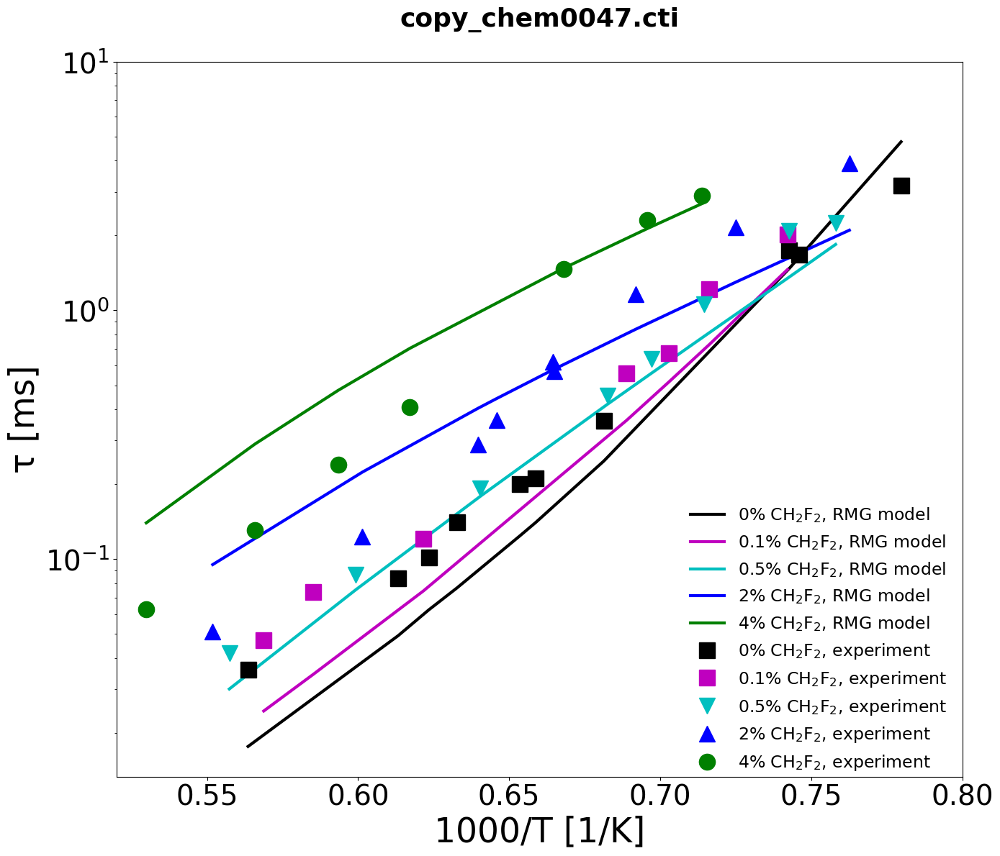

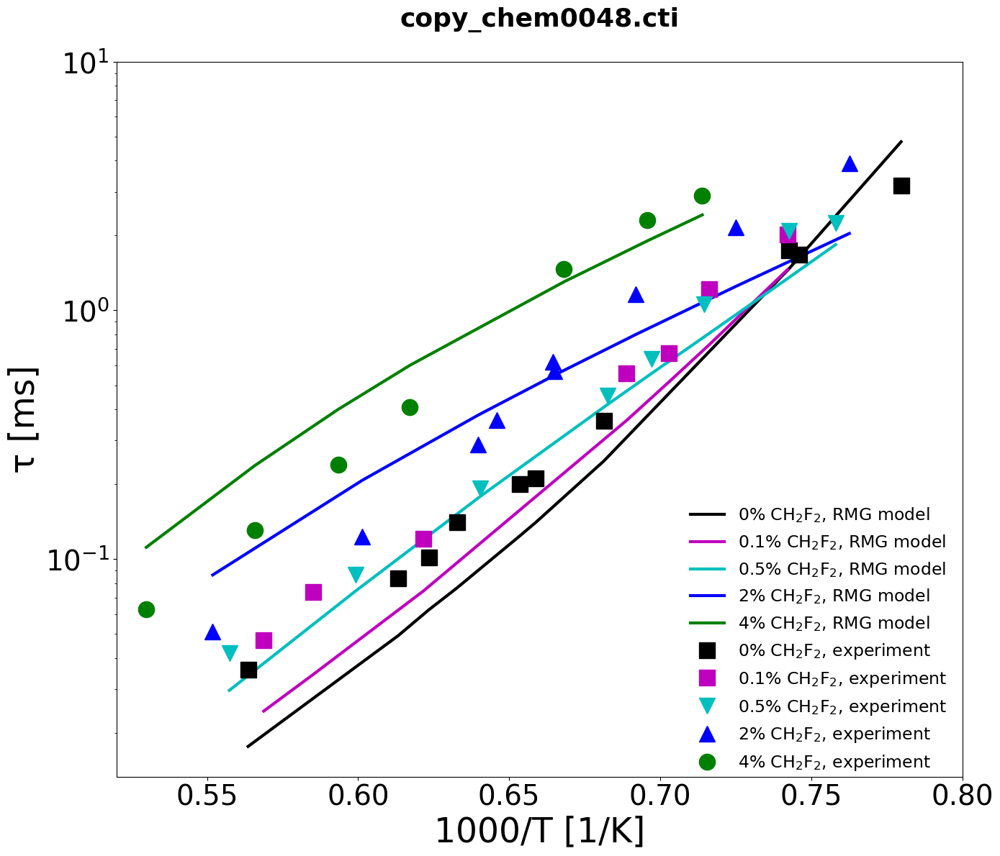

...

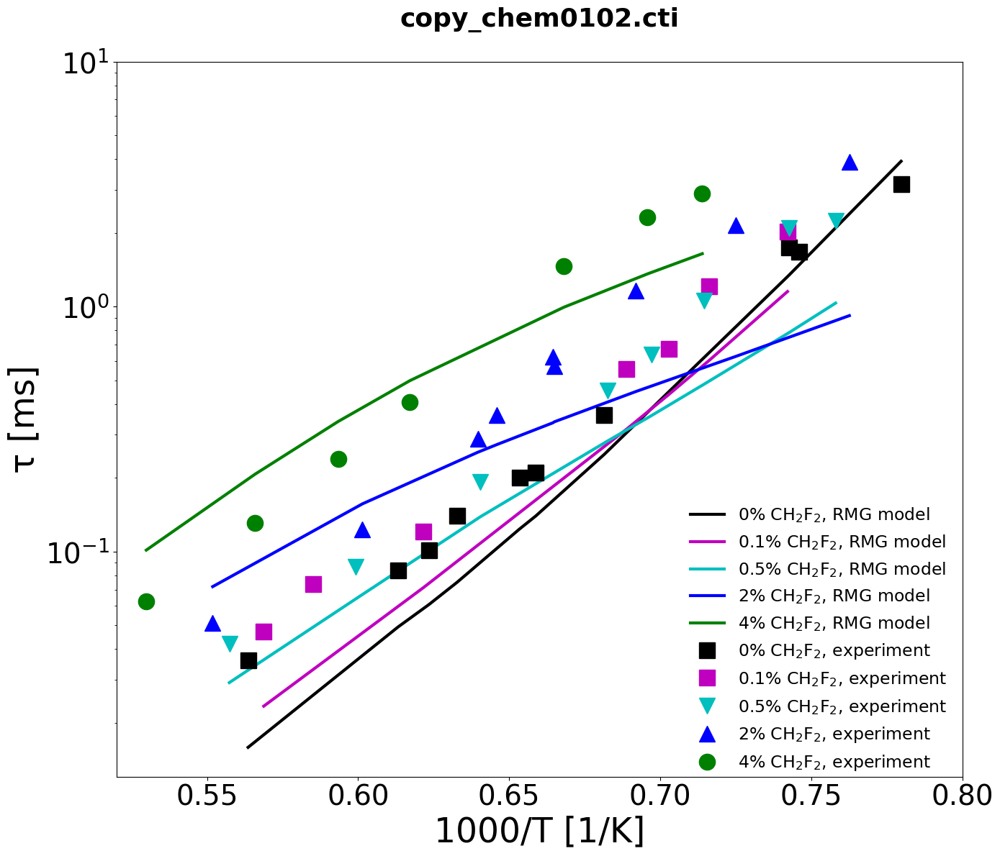

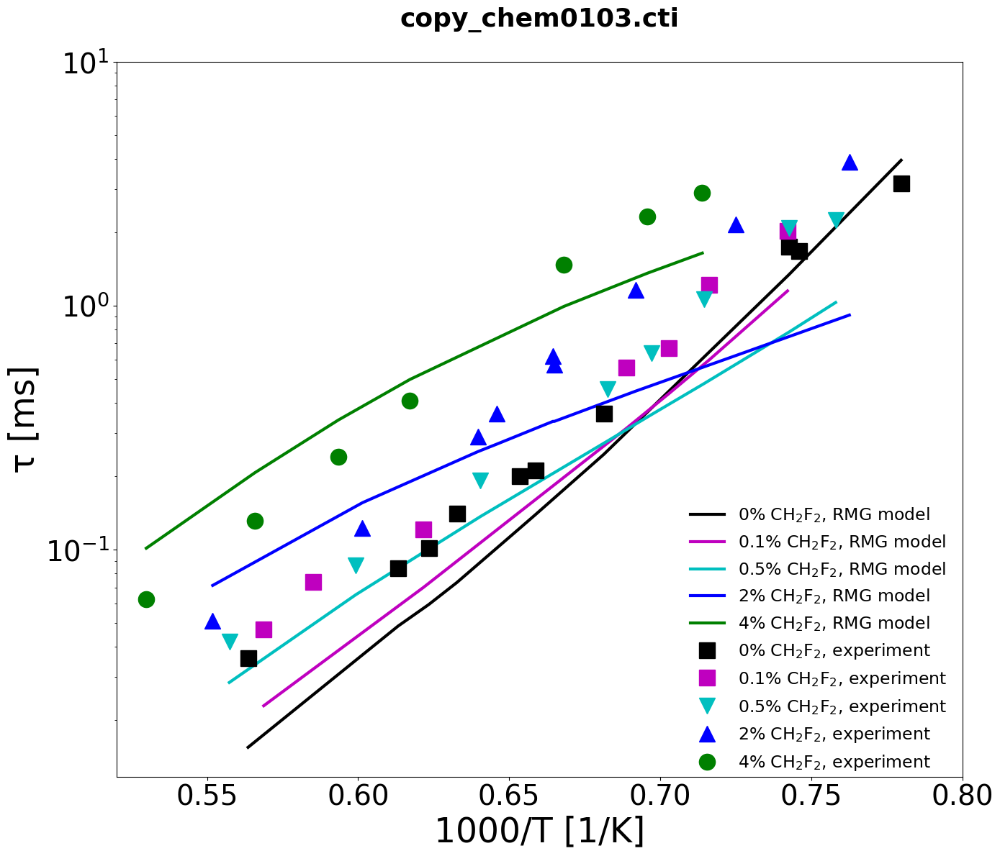

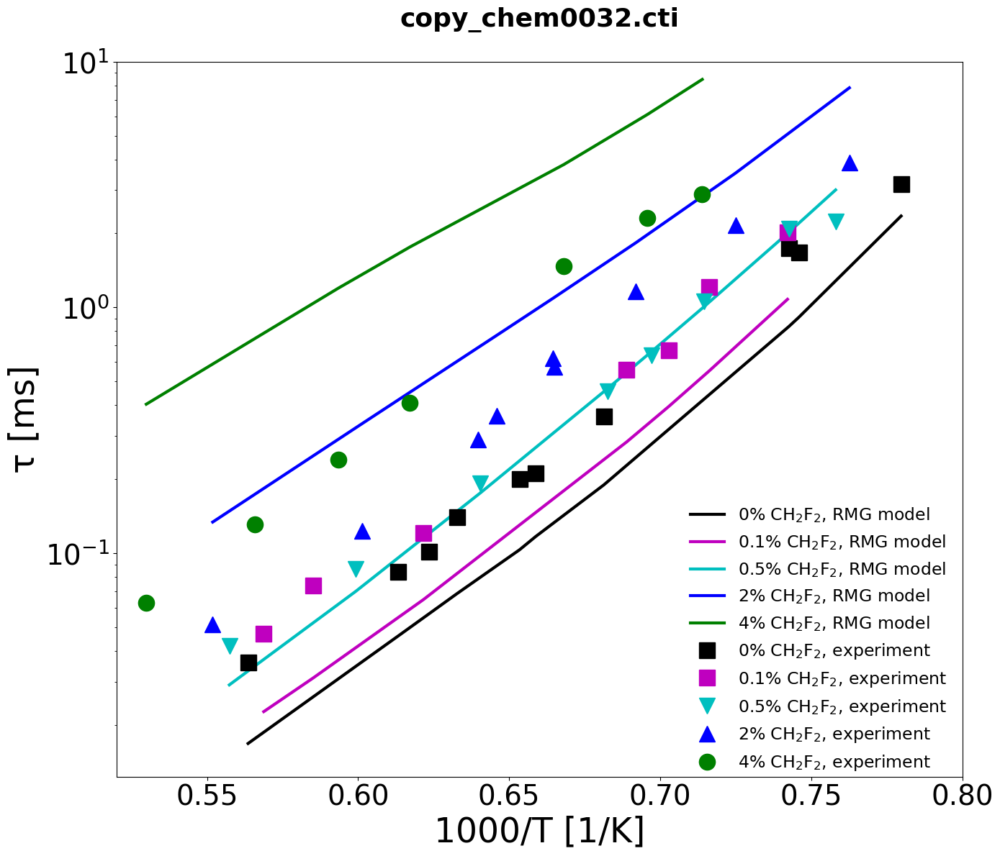

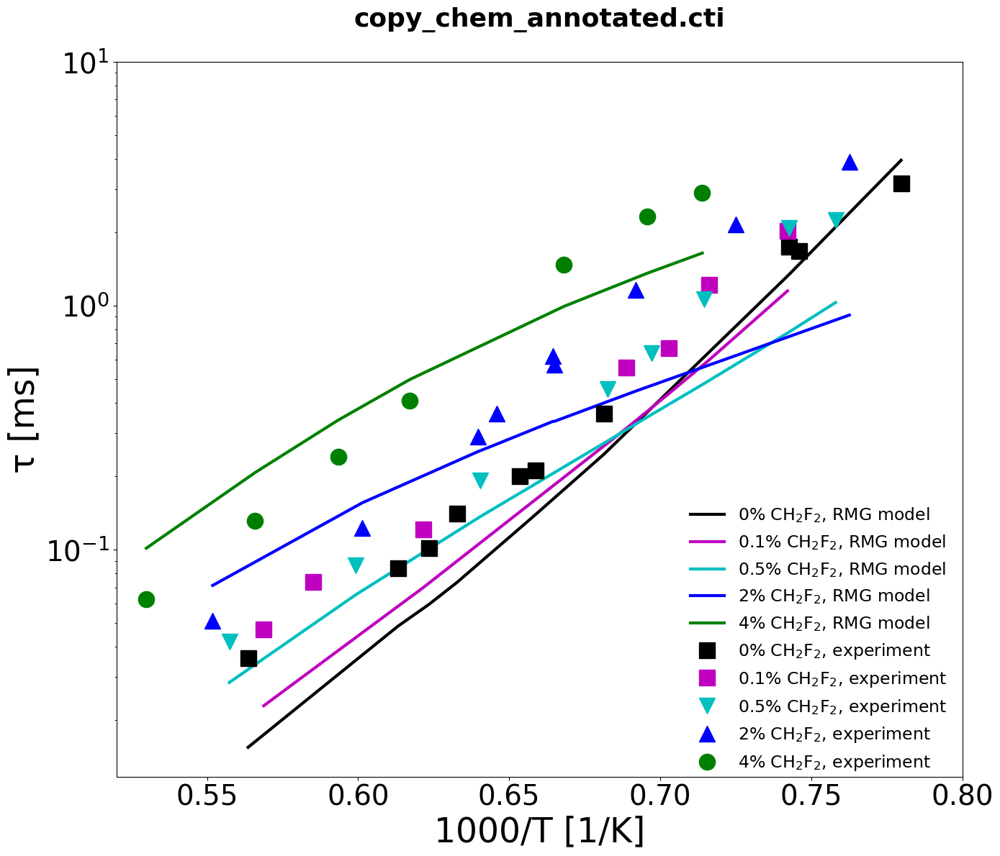

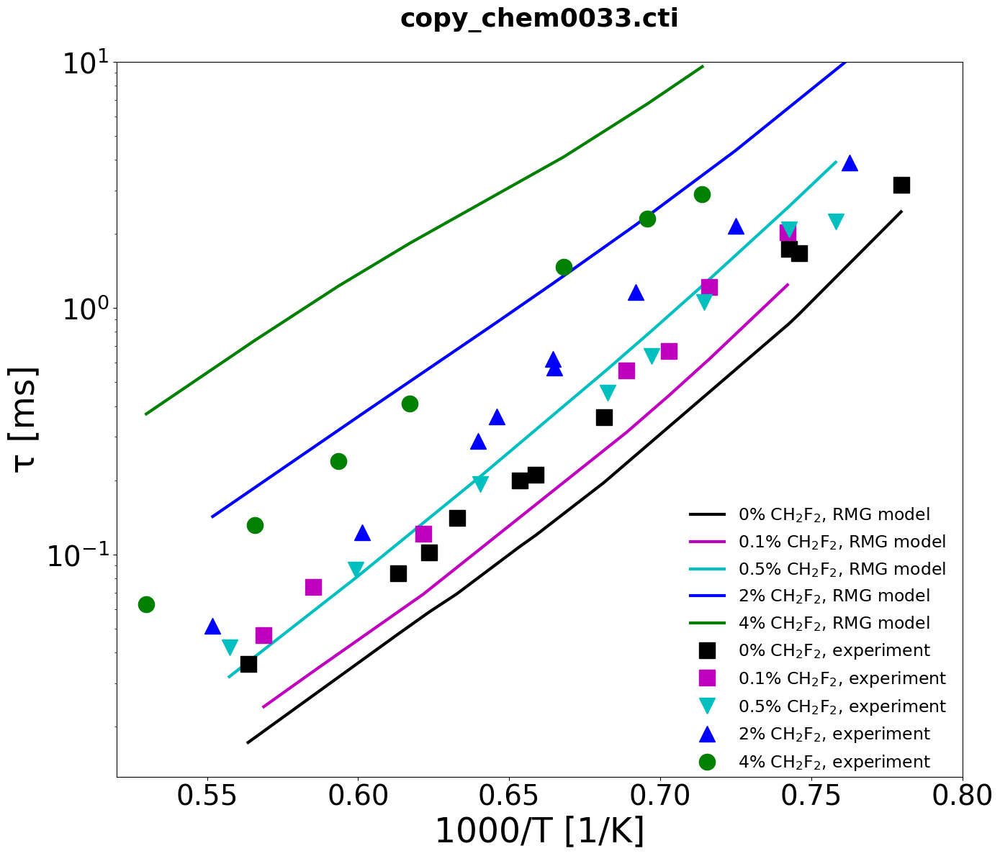

In [23]:
#PLOTTING SECTION
plt.rcParams['figure.figsize'] = (14, 12)
plt.rcParams['axes.labelsize'] = 34
plt.rcParams['xtick.labelsize'] = 28
plt.rcParams['ytick.labelsize'] = 28
plt.rcParams['figure.autolayout'] = True
matplotlib.rcParams['font.family'] = 'Times New Roman'

#my model
X_list = [0,0.1,0.5,2,4]
colors = [no_CH2F2_color,
pt1_CH2F2_color,
pt5_CH2F2_color,
_2_CH2F2_color,
_4_CH2F2_color]

labels = [no_CH2F2_label,
 pt1_CH2F2_label,
pt5_CH2F2_label,
_2_CH2F2_label,
_4_CH2F2_label]

exp_taus = {0: np.array(no_CH2F2_taus),
0.1: np.array(pt1_CH2F2_taus),
0.5: np.array(pt5_CH2F2_taus),
2: np.array(_2_CH2F2_taus),
4: np.array(_4_CH2F2_taus)}

output_files = [file for file in os.listdir('.') if 'output' in file]
for file in output_files: 
    with open(file, 'r') as f: 
        lines = f.readlines()
        file_name = lines[1]
        master_dict_string = ' '.join(lines[-6:])
        edited_master_string = master_dict_string.replace('\n', '').replace('array', 'np.array')
        try: 
            master_dict=eval(edited_master_string)
        except NameError as e:
            print(e)
            continue
    
    for x, color, lbl in zip(X_list, colors, labels):
        taus = master_dict[x]
        taus_to_plot = np.array(taus)#[tau for tau in taus if tau>0])

        plt.semilogy([1000/T for T in specific_temps[x]], taus_to_plot, '-', c=color, label=f'{lbl}, RMG model', markersize=16, linewidth=3) 


    #experiments

    plt.semilogy(no_CH2F2_temps_inv, no_CH2F2_taus, no_CH2F2_shape, c=no_CH2F2_color, label=no_CH2F2_label+', experiment', markersize=16) 
    plt.semilogy(pt1_CH2F2_temps_inv, pt1_CH2F2_taus, pt1_CH2F2_shape, c=pt1_CH2F2_color, label=pt1_CH2F2_label+', experiment', markersize=16) 
    plt.semilogy(pt5_CH2F2_temps_inv, pt5_CH2F2_taus, pt5_CH2F2_shape, c=pt5_CH2F2_color, label=pt5_CH2F2_label+', experiment', markersize=16) 
    plt.semilogy(_2_CH2F2_temps_inv, _2_CH2F2_taus, _2_CH2F2_shape, c=_2_CH2F2_color, label=_2_CH2F2_label+', experiment', markersize=16) 
    plt.semilogy(_4_CH2F2_temps_inv, _4_CH2F2_taus, _4_CH2F2_shape, c=_4_CH2F2_color, label=_4_CH2F2_label+', experiment', markersize=16) 
    plt.ylim(0,10)
    plt.title(file_name, fontsize=26, fontweight="bold")
    plt.xlim(0.52,0.8)
    plt.xlabel('1000/T [1/K]')
    plt.ylabel('τ [ms]')
    plt.legend(fontsize=17, bbox_to_anchor=(1, 0.4), frameon=False)

    plt.show()


In [ ]:
#my model plots


#PLOTTING SECTION
plt.rcParams['figure.figsize'] = (14, 12)
plt.rcParams['axes.labelsize'] = 34
plt.rcParams['xtick.labelsize'] = 28
plt.rcParams['ytick.labelsize'] = 28
plt.rcParams['figure.autolayout'] = True
matplotlib.rcParams['font.family'] = 'Times New Roman'

#my model
X_list = [0,0.1,0.5,2,4]
colors = [no_CH2F2_color,
pt1_CH2F2_color,
pt5_CH2F2_color,
_2_CH2F2_color,
_4_CH2F2_color]

labels = [no_CH2F2_label,
 pt1_CH2F2_label,
pt5_CH2F2_label,
_2_CH2F2_label,
_4_CH2F2_label]

exp_taus = {0: np.array(no_CH2F2_taus),
0.1: np.array(pt1_CH2F2_taus),
0.5: np.array(pt5_CH2F2_taus),
2: np.array(_2_CH2F2_taus),
4: np.array(_4_CH2F2_taus)}

#plot values and calculate RMSE and slopes  
average_slopes = []
for x, color, lbl in zip(X_list, colors, labels):
    taus = Frank_edits_restart_81[x]
    taus_to_plot = np.array(taus)#[tau for tau in taus if tau>0])
    
    plt.semilogy([1000/T for T in specific_temps[x]], taus_to_plot, '-', c=color, label=f'{lbl}, RMG model', markersize=16, linewidth=3) 
        

#experiments

plt.semilogy(no_CH2F2_temps_inv, no_CH2F2_taus, no_CH2F2_shape, c=no_CH2F2_color, label=no_CH2F2_label+', experiment', markersize=16) 
plt.semilogy(pt1_CH2F2_temps_inv, pt1_CH2F2_taus, pt1_CH2F2_shape, c=pt1_CH2F2_color, label=pt1_CH2F2_label+', experiment', markersize=16) 
plt.semilogy(pt5_CH2F2_temps_inv, pt5_CH2F2_taus, pt5_CH2F2_shape, c=pt5_CH2F2_color, label=pt5_CH2F2_label+', experiment', markersize=16) 
plt.semilogy(_2_CH2F2_temps_inv, _2_CH2F2_taus, _2_CH2F2_shape, c=_2_CH2F2_color, label=_2_CH2F2_label+', experiment', markersize=16) 
plt.semilogy(_4_CH2F2_temps_inv, _4_CH2F2_taus, _4_CH2F2_shape, c=_4_CH2F2_color, label=_4_CH2F2_label+', experiment', markersize=16) 
plt.ylim(0,10)
#plt.title('', fontsize=26, fontweight="bold")
plt.xlim(0.52,0.8)
plt.xlabel('1000/T [1/K]')
plt.ylabel('τ [ms]')
plt.legend(fontsize=17, bbox_to_anchor=(1, 0.4), frameon=False)

plt.show()
    